In [1]:
import os
import cv2
import numpy as np
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from skimage.metrics import peak_signal_noise_ratio as sk_psnr
from skimage.metrics import structural_similarity as sk_ssim

# Define the validation dataset (you can adjust paths as needed)
VALIDATION_LR_DIR = "/kaggle/input/gnr638/train-kaggle/train-kaggle/lr"
VALIDATION_HR_DIR = "/kaggle/input/gnr638/train-kaggle/train-kaggle/hr"

class SRTrainDataset(Dataset):
    def __init__(self, lr_dir, hr_dir, filenames):
        self.lr_dir = lr_dir
        self.hr_dir = hr_dir
        self.filenames = filenames

    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        fname = self.filenames[idx]
        lr_path = os.path.join(self.lr_dir, fname)
        hr_path = os.path.join(self.hr_dir, fname)
        lr_img = cv2.imread(lr_path, cv2.IMREAD_COLOR)
        hr_img = cv2.imread(hr_path, cv2.IMREAD_COLOR)
        if lr_img is None or hr_img is None:
            raise ValueError(f"Failed to load images for {fname}")
        lr_img = cv2.cvtColor(lr_img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        hr_img = cv2.cvtColor(hr_img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        # Convert to tensor and permute dimensions (C, H, W)
        lr_img = torch.from_numpy(lr_img).permute(2, 0, 1)
        hr_img = torch.from_numpy(hr_img).permute(2, 0, 1)
        return lr_img, hr_img

# List filenames that exist in both directories
all_filenames = sorted(os.listdir(VALIDATION_LR_DIR))
filenames = [f for f in all_filenames if os.path.exists(os.path.join(VALIDATION_HR_DIR, f))]

# Create DataLoader for validation
val_dataset = SRTrainDataset(VALIDATION_LR_DIR, VALIDATION_HR_DIR, filenames)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# -------------------------------------------
# Define the EnhancedSRNet Model
# -------------------------------------------
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(channels, channels, 3, padding=1)
        self.relu  = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(channels, channels, 3, padding=1)
        
    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)
        out += identity
        return self.relu(out)

class UpscaleBlock(nn.Module):
    def __init__(self, in_channels, upscale_factor=2):
        super(UpscaleBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, in_channels * upscale_factor * upscale_factor, 3, padding=1)
        self.pixel_shuffle = nn.PixelShuffle(upscale_factor)
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, x):
        x = self.conv(x)
        x = self.pixel_shuffle(x)
        return self.relu(x)

class EnhancedSRNet(nn.Module):
    def __init__(self, num_residual_blocks=4, upscale_factor=4):
        super(EnhancedSRNet, self).__init__()
        self.head = nn.Conv2d(3, 64, 3, padding=1)
        self.relu = nn.ReLU(inplace=True)
        self.residuals = nn.Sequential(*[ResidualBlock(64) for _ in range(num_residual_blocks)])
        # Two stages of 2x upscaling for a total upscale factor of 4.
        self.upscale1 = UpscaleBlock(64, upscale_factor=2)
        self.upscale2 = UpscaleBlock(64, upscale_factor=2)
        self.tail = nn.Conv2d(64, 3, 3, padding=1)
        
    def forward(self, x):
        x_input = x  # For global skip connection.
        out = self.head(x)
        out = self.relu(out)
        out = self.residuals(out)
        out = self.upscale1(out)
        out = self.upscale2(out)
        out = self.tail(out)
        # Global skip: upscale the input and add.
        skip = F.interpolate(x_input, scale_factor=4, mode='bilinear', align_corners=False)
        out += skip
        return torch.sigmoid(out)

# Create the model and load the best saved weights
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = EnhancedSRNet(num_residual_blocks=4, upscale_factor=4).to(DEVICE)
best_weights_path = "/kaggle/input/reconstruction/pytorch/default/1/best.pth"
if os.path.exists(best_weights_path):
    print("Loading best model weights from", best_weights_path)
    model.load_state_dict(torch.load(best_weights_path, map_location=DEVICE))
else:
    print("Best weights not found. Check the path:", best_weights_path)

model.eval()  # Set model to evaluation mode

# -------------------------------------------
# Define the evaluation function
# -------------------------------------------
def calculate_metrics(gt, pred):
    """
    gt, pred: numpy arrays of shape (H, W, C) in [0,1]
    Returns: joint metric, PSNR, SSIM.
    """
    h, w, _ = gt.shape
    # Ensure win_size is odd
    win_size = 7 if min(h, w) >= 7 else (min(h, w) // 2 * 2 + 1)
    psnr_val = sk_psnr(gt, pred, data_range=1.0)
    ssim_val = sk_ssim(gt, pred, data_range=1.0, channel_axis=-1, win_size=win_size)
    joint_metric = 40 * ssim_val + psnr_val
    return joint_metric, psnr_val, ssim_val

def evaluate_model(model, dataloader):
    model.eval()
    joint_scores = []
    with torch.no_grad():
        for lr_imgs, hr_imgs in dataloader:
            lr_imgs = lr_imgs.to(DEVICE)
            outputs = model(lr_imgs)
            outputs_np = outputs.cpu().numpy()
            hr_imgs_np = hr_imgs.cpu().numpy()
            for pred, gt in zip(outputs_np, hr_imgs_np):
                pred = np.transpose(pred, (1, 2, 0))
                gt = np.transpose(gt, (1, 2, 0))
                joint, psnr_val, ssim_val = calculate_metrics(gt, pred)
                joint_scores.append(joint)
                print(f"PSNR: {psnr_val:.2f}, SSIM: {ssim_val:.4f}, Joint Metric: {joint:.2f}")
    avg_joint = np.mean(joint_scores)
    print(f"\nAverage Joint Metric on Validation Set: {avg_joint:.2f}")
    return avg_joint

# Run evaluation on the validation set
print("Running evaluation on the validation dataset:")
average_joint_metric = evaluate_model(model, val_loader)


Loading best model weights from /kaggle/input/reconstruction/pytorch/default/1/best.pth
Running evaluation on the validation dataset:


/tmp/ipykernel_19/4085032834.py:110: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_weights_path, map_location=DEVICE))


PSNR: 28.31, SSIM: 0.8547, Joint Metric: 62.50
PSNR: 22.00, SSIM: 0.5967, Joint Metric: 45.87
PSNR: 21.08, SSIM: 0.5683, Joint Metric: 43.81
PSNR: 26.81, SSIM: 0.8981, Joint Metric: 62.73
PSNR: 28.16, SSIM: 0.8249, Joint Metric: 61.15
PSNR: 24.77, SSIM: 0.8334, Joint Metric: 58.10
PSNR: 26.98, SSIM: 0.9011, Joint Metric: 63.02
PSNR: 27.11, SSIM: 0.8703, Joint Metric: 61.93
PSNR: 25.31, SSIM: 0.6763, Joint Metric: 52.36
PSNR: 21.88, SSIM: 0.6115, Joint Metric: 46.34
PSNR: 38.45, SSIM: 0.9676, Joint Metric: 77.16
PSNR: 20.72, SSIM: 0.6438, Joint Metric: 46.47
PSNR: 27.31, SSIM: 0.7852, Joint Metric: 58.72
PSNR: 28.67, SSIM: 0.8613, Joint Metric: 63.12
PSNR: 25.30, SSIM: 0.7488, Joint Metric: 55.25
PSNR: 25.64, SSIM: 0.8098, Joint Metric: 58.03
PSNR: 23.48, SSIM: 0.7069, Joint Metric: 51.76
PSNR: 23.55, SSIM: 0.7837, Joint Metric: 54.89
PSNR: 24.64, SSIM: 0.7621, Joint Metric: 55.12
PSNR: 17.80, SSIM: 0.6479, Joint Metric: 43.72
PSNR: 23.34, SSIM: 0.7292, Joint Metric: 52.51
PSNR: 24.93, 

In [2]:
import os
import cv2
import base64
import numpy as np
import pandas as pd
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

from skimage.metrics import peak_signal_noise_ratio as sk_psnr
from skimage.metrics import structural_similarity as sk_ssim

# -------------------------------------------
# Setup Directories and Global Parameters
# -------------------------------------------
TEST_LR_DIR  = "/kaggle/input/gnr638/lr/lr"
SUBMISSION_DIR = "/kaggle/input/reconstruction/pytorch/default/1/"
os.makedirs(SUBMISSION_DIR, exist_ok=True)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_WORKERS = 2

# -------------------------------------------
# Define the Test Dataset
# -------------------------------------------
class SRTestDataset(Dataset):
    def __init__(self, lr_dir, filenames, target_size=(480, 270)):
        self.lr_dir = lr_dir
        self.filenames = filenames
        self.target_size = target_size  # (width, height)

    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        fname = self.filenames[idx]
        path = os.path.join(self.lr_dir, fname)
        img = cv2.imread(path, cv2.IMREAD_COLOR)
        if img is None:
            raise ValueError(f"Failed to load test image: {fname}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        img = cv2.resize(img, (self.target_size[0], self.target_size[1]))
        img = torch.from_numpy(img).permute(2, 0, 1)
        return img, fname

test_filenames = sorted(os.listdir(TEST_LR_DIR))
test_dataset = SRTestDataset(TEST_LR_DIR, test_filenames)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False,
                         num_workers=NUM_WORKERS, pin_memory=True)

# -------------------------------------------
# Define the EnhancedSRNet Model Architecture
# -------------------------------------------
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(channels, channels, 3, padding=1)
        self.relu  = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(channels, channels, 3, padding=1)
        
    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)
        out += identity
        return self.relu(out)

class UpscaleBlock(nn.Module):
    def __init__(self, in_channels, upscale_factor=2):
        super(UpscaleBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, in_channels * upscale_factor * upscale_factor, 3, padding=1)
        self.pixel_shuffle = nn.PixelShuffle(upscale_factor)
        self.relu = nn.ReLU(inplace=True)
        
    def forward(self, x):
        x = self.conv(x)
        x = self.pixel_shuffle(x)
        return self.relu(x)

class EnhancedSRNet(nn.Module):
    def __init__(self, num_residual_blocks=4, upscale_factor=4):
        super(EnhancedSRNet, self).__init__()
        self.head = nn.Conv2d(3, 64, 3, padding=1)
        self.relu = nn.ReLU(inplace=True)
        self.residuals = nn.Sequential(*[ResidualBlock(64) for _ in range(num_residual_blocks)])
        # For a 4x upscale, apply two stages of 2x upscaling.
        self.upscale1 = UpscaleBlock(64, upscale_factor=2)
        self.upscale2 = UpscaleBlock(64, upscale_factor=2)
        self.tail = nn.Conv2d(64, 3, 3, padding=1)
        
    def forward(self, x):
        # Save input for global skip connection.
        x_input = x
        out = self.head(x)
        out = self.relu(out)
        out = self.residuals(out)
        out = self.upscale1(out)
        out = self.upscale2(out)
        out = self.tail(out)
        # Global skip connection: upscale input by 4.
        skip = F.interpolate(x_input, scale_factor=4, mode='bilinear', align_corners=False)
        out += skip
        return torch.sigmoid(out)

# Create the model instance and load the best weights.
model = EnhancedSRNet(num_residual_blocks=4, upscale_factor=4).to(DEVICE)
best_weights_path = os.path.join(SUBMISSION_DIR, "best.pth")
if os.path.exists(best_weights_path):
    print("Loading best model weights from:", best_weights_path)
    model.load_state_dict(torch.load(best_weights_path, map_location=DEVICE))
else:
    print("Best weights not found at", best_weights_path)
model.eval()

# -------------------------------------------
# Function to Encode Image to Base64
# -------------------------------------------
def encode_image_to_base64(image_array):
    """
    image_array: numpy array of shape (H, W, 3) in [0,1]
    Returns a Base64-encoded PNG string.
    """
    image_uint8 = np.clip(image_array * 255.0, 0, 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2BGR)
    success, encoded_image = cv2.imencode('.png', image_bgr)
    if success:
        return base64.b64encode(encoded_image).decode('utf-8')
    else:
        raise ValueError("Image encoding failed.")

# -------------------------------------------
# Generate the Submission CSV
# -------------------------------------------
submission_records = []
model.eval()
with torch.no_grad():
    for imgs, batch_fnames in tqdm(test_loader, desc="Generating submission"):
        imgs = imgs.to(DEVICE)
        preds = model(imgs)
        preds = preds.cpu().numpy()
        for pred, fname in zip(preds, batch_fnames):
            pred_img = np.transpose(pred, (1, 2, 0))
            encoded_str = encode_image_to_base64(pred_img)
            submission_records.append({'id': fname, 'Encoded_Image': encoded_str})

# Create DataFrame and save CSV as submission_best.csv
df = pd.DataFrame(submission_records)
submission_csv_path = os.path.join("/kaggle/working/", "submission_best.csv")
df.to_csv(submission_csv_path, index=False)
print("Submission CSV saved at:", submission_csv_path)


/tmp/ipykernel_19/770101297.py:114: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(best_weights_path, map_location=DEVICE))


Loading best model weights from: /kaggle/input/reconstruction/pytorch/default/1/best.pth


Generating submission: 100%|██████████| 63/63 [02:05<00:00,  2.00s/it]


Submission CSV saved at: /kaggle/working/submission_best.csv


In [3]:
import os
import cv2
import base64
import numpy as np
import pandas as pd
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.amp import GradScaler, autocast

from skimage.metrics import peak_signal_noise_ratio as sk_psnr
from skimage.metrics import structural_similarity as sk_ssim

##############################################
# 1. Setup Directories and Global Parameters
##############################################
TRAIN_LR_DIR = "/kaggle/input/gnr638/train-kaggle/train-kaggle/lr"
TRAIN_HR_DIR = "/kaggle/input/gnr638/train-kaggle/train-kaggle/hr"
TEST_LR_DIR  = "/kaggle/input/gnr638/lr/lr"
SUBMISSION_DIR = "/kaggle/working/submissions"
os.makedirs(SUBMISSION_DIR, exist_ok=True)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 1     # Adjust according to your GPU memory
EPOCHS = 10        # Increase for better performance

NUM_WORKERS = 2    # Adjust if needed

##############################################
# 2. Define PyTorch Datasets
##############################################
class SRTrainDataset(Dataset):
    def __init__(self, lr_dir, hr_dir, filenames, transform=None):
        self.lr_dir = lr_dir
        self.hr_dir = hr_dir
        self.filenames = filenames
        self.transform = transform

    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        fname = self.filenames[idx]
        lr_path = os.path.join(self.lr_dir, fname)
        hr_path = os.path.join(self.hr_dir, fname)
        lr_img = cv2.imread(lr_path, cv2.IMREAD_COLOR)
        hr_img = cv2.imread(hr_path, cv2.IMREAD_COLOR)
        if lr_img is None or hr_img is None:
            raise ValueError(f"Failed to load images for {fname}")
        lr_img = cv2.cvtColor(lr_img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        hr_img = cv2.cvtColor(hr_img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        lr_img = torch.from_numpy(lr_img).permute(2, 0, 1)
        hr_img = torch.from_numpy(hr_img).permute(2, 0, 1)
        return lr_img, hr_img

class SRTestDataset(Dataset):
    def __init__(self, lr_dir, filenames, target_size=(480,270)):
        self.lr_dir = lr_dir
        self.filenames = filenames
        self.target_size = target_size

    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        fname = self.filenames[idx]
        path = os.path.join(self.lr_dir, fname)
        img = cv2.imread(path, cv2.IMREAD_COLOR)
        if img is None:
            raise ValueError(f"Failed to load test image: {fname}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        img = cv2.resize(img, (self.target_size[0], self.target_size[1]))
        img = torch.from_numpy(img).permute(2, 0, 1)
        return img, fname

all_filenames = sorted(os.listdir(TRAIN_LR_DIR))
filenames = [f for f in all_filenames if os.path.exists(os.path.join(TRAIN_HR_DIR, f))]
dataset_size = len(filenames)
train_size = int(0.9 * dataset_size)
train_filenames = filenames[:train_size]
val_filenames = filenames[train_size:]

train_dataset = SRTrainDataset(TRAIN_LR_DIR, TRAIN_HR_DIR, train_filenames)
val_dataset = SRTrainDataset(TRAIN_LR_DIR, TRAIN_HR_DIR, val_filenames)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False,
                        num_workers=NUM_WORKERS, pin_memory=True)

test_filenames = sorted(os.listdir(TEST_LR_DIR))
test_dataset = SRTestDataset(TEST_LR_DIR, test_filenames)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False,
                         num_workers=NUM_WORKERS, pin_memory=True)

##############################################
# 3. Define an Insane Enhanced Super-Resolution Model
#    (Inspired by RRDB from ESRGAN)
##############################################

# Residual Dense Block (RDB)
class ResidualDenseBlock(nn.Module):
    def __init__(self, in_channels, growth_channels=32, num_layers=5):
        super(ResidualDenseBlock, self).__init__()
        self.layers = nn.ModuleList()
        for i in range(num_layers):
            self.layers.append(
                nn.Conv2d(in_channels + i * growth_channels, growth_channels, kernel_size=3, padding=1)
            )
        self.lrelu = nn.LeakyReLU(negative_slope=0.2, inplace=True)
        self.conv_1x1 = nn.Conv2d(in_channels + num_layers * growth_channels, in_channels, kernel_size=1)
        
    def forward(self, x):
        inputs = [x]
        for conv in self.layers:
            concat = torch.cat(inputs, 1)
            out = self.lrelu(conv(concat))
            inputs.append(out)
        out = torch.cat(inputs, 1)
        out = self.conv_1x1(out)
        return out * 0.2 + x  # residual scaling

# Residual-in-Residual Dense Block (RRDB)
class RRDB(nn.Module):
    def __init__(self, in_channels, growth_channels=32, num_layers=5):
        super(RRDB, self).__init__()
        self.rdb1 = ResidualDenseBlock(in_channels, growth_channels, num_layers)
        self.rdb2 = ResidualDenseBlock(in_channels, growth_channels, num_layers)
        self.rdb3 = ResidualDenseBlock(in_channels, growth_channels, num_layers)
        
    def forward(self, x):
        out = self.rdb1(x)
        out = self.rdb2(out)
        out = self.rdb3(out)
        return out * 0.2 + x  # residual scaling

# Upscale block using PixelShuffle remains similar
class UpscaleBlock(nn.Module):
    def __init__(self, in_channels, upscale_factor=2):
        super(UpscaleBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, in_channels * upscale_factor * upscale_factor, 3, padding=1)
        self.pixel_shuffle = nn.PixelShuffle(upscale_factor)
        self.lrelu = nn.LeakyReLU(negative_slope=0.2, inplace=True)
    def forward(self, x):
        x = self.conv(x)
        x = self.pixel_shuffle(x)
        return self.lrelu(x)

# InsaneSRNet: Our advanced model
class InsaneSRNet(nn.Module):
    def __init__(self, num_rrdb=5, in_channels=3, channels=64, upscale_factor=4):
        super(InsaneSRNet, self).__init__()
        self.head = nn.Conv2d(in_channels, channels, 3, padding=1)
        # RRDB trunk
        self.trunk = nn.Sequential(*[RRDB(channels) for _ in range(num_rrdb)])
        self.trunk_conv = nn.Conv2d(channels, channels, 3, padding=1)
        # Upscaling modules; for 4x upscale, we need two 2x stages.
        self.upscale1 = UpscaleBlock(channels, upscale_factor=2)
        self.upscale2 = UpscaleBlock(channels, upscale_factor=2)
        self.tail = nn.Conv2d(channels, in_channels, 3, padding=1)
        
    def forward(self, x):
        # Global skip connection: upscale the input by factor 4.
        skip = F.interpolate(x, scale_factor=4, mode='bilinear', align_corners=False)
        out = self.head(x)
        out = self.trunk(out)
        out = self.trunk_conv(out)
        out = self.upscale1(out)
        out = self.upscale2(out)
        out = self.tail(out)
        out += skip
        return torch.sigmoid(out)

# Instantiate the advanced model
model = InsaneSRNet(num_rrdb=5, in_channels=3, channels=64, upscale_factor=4).to(DEVICE)
optimizer = Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

print("Advanced InsaneSRNet Model:")
print(model)

##############################################
# 4. Define Helper Metric Functions (PSNR & SSIM)
##############################################
def calculate_metrics(gt, pred):
    """
    gt, pred: numpy arrays of shape (H, W, C) in [0,1]
    Returns: joint metric, PSNR, SSIM.
    """
    h, w, _ = gt.shape
    win_size = 7 if min(h, w) >= 7 else (min(h, w) // 2 * 2 + 1)
    psnr_val = sk_psnr(gt, pred, data_range=1.0)
    ssim_val = sk_ssim(gt, pred, data_range=1.0, channel_axis=-1, win_size=win_size)
    joint_metric = 40 * ssim_val + psnr_val
    return joint_metric, psnr_val, ssim_val

##############################################
# 5. Helper Function for Image Encoding (Base64)
##############################################
def encode_image_to_base64(image_array):
    """
    image_array: numpy array of shape (H, W, C) in [0,1]
    Returns: Base64-encoded PNG string.
    """
    image_uint8 = np.clip(image_array * 255.0, 0, 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2BGR)
    success, encoded_image = cv2.imencode('.png', image_bgr)
    if success:
        return base64.b64encode(encoded_image).decode('utf-8')
    else:
        raise ValueError("Image encoding failed.")

##############################################
# 6. Evaluation on the Validation Set
##############################################
def evaluate_model(model, dataloader):
    model.eval()
    joint_scores = []
    with torch.no_grad():
        for lr_imgs, hr_imgs in dataloader:
            lr_imgs = lr_imgs.to(DEVICE)
            outputs = model(lr_imgs)
            outputs_np = outputs.cpu().numpy()
            hr_imgs_np = hr_imgs.cpu().numpy()
            for pred, gt in zip(outputs_np, hr_imgs_np):
                pred = np.transpose(pred, (1, 2, 0))
                gt = np.transpose(gt, (1, 2, 0))
                joint, psnr_val, ssim_val = calculate_metrics(gt, pred)
                joint_scores.append(joint)
                print(f"PSNR: {psnr_val:.2f}, SSIM: {ssim_val:.4f}, Joint Metric: {joint:.2f}")
    avg_joint = np.mean(joint_scores)
    print(f"\nAverage Joint Metric on Validation Set: {avg_joint:.2f}")
    model.train()
    return avg_joint

##############################################
# 7. Generate Submission CSV after Each Epoch
##############################################
def generate_submission_csv(model, dataloader, test_filenames, epoch, submission_dir):
    model.eval()
    submission_records = []
    with torch.no_grad():
        for imgs, batch_fnames in tqdm(dataloader, desc="Generating submission"):
            imgs = imgs.to(DEVICE)
            preds = model(imgs)
            preds = preds.cpu().numpy()
            for pred, fname in zip(preds, batch_fnames):
                pred_img = np.transpose(pred, (1, 2, 0))
                encoded_str = encode_image_to_base64(pred_img)
                submission_records.append({'id': fname, 'Encoded_Image': encoded_str})
    df = pd.DataFrame(submission_records)
    csv_filename = os.path.join(submission_dir, f"submission_epoch{epoch+1}.csv")
    df.to_csv(csv_filename, index=False)
    print(f"Submission CSV saved for epoch {epoch+1} at: {csv_filename}")
    model.train()

##############################################
# 8. Training Loop with Mixed Precision, Weight Saving, and Submission CSV Generation
##############################################
scaler = GradScaler()
best_metric = -float('inf')

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} - Training")
    for lr_imgs, hr_imgs in progress_bar:
        lr_imgs = lr_imgs.to(DEVICE)
        hr_imgs = hr_imgs.to(DEVICE)
        optimizer.zero_grad()
        with autocast(device_type='cuda'):
            outputs = model(lr_imgs)
            loss = criterion(outputs, hr_imgs)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        train_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())
    
    avg_train_loss = train_loss / len(train_loader)
    print(f"\nEpoch {epoch+1} Training Loss: {avg_train_loss:.6f}")
    
    # Generate submission CSV on test set after each epoch
    generate_submission_csv(model, test_loader, test_filenames, epoch, SUBMISSION_DIR)
    
    # Evaluate on validation set
    print("\nEvaluating on validation set:")
    avg_joint = evaluate_model(model, val_loader)
    
    # Save the latest weights
    latest_path = os.path.join(SUBMISSION_DIR, "latest.pth")
    torch.save(model.state_dict(), latest_path)
    print(f"Latest weights saved at: {latest_path}")
    
    # Save best weights if current performance improves
    if avg_joint > best_metric:
        best_metric = avg_joint
        best_path = os.path.join(SUBMISSION_DIR, "best.pth")
        torch.save(model.state_dict(), best_path)
        print(f"New best model saved at: {best_path}")
    
    torch.cuda.empty_cache()

print("Training completed.")


Advanced InsaneSRNet Model:
InsaneSRNet(
  (head): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (trunk): Sequential(
    (0): RRDB(
      (rdb1): ResidualDenseBlock(
        (layers): ModuleList(
          (0): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): Conv2d(96, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (3): Conv2d(160, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (4): Conv2d(192, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (lrelu): LeakyReLU(negative_slope=0.2, inplace=True)
        (conv_1x1): Conv2d(224, 64, kernel_size=(1, 1), stride=(1, 1))
      )
      (rdb2): ResidualDenseBlock(
        (layers): ModuleList(
          (0): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): Conv2d(96, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1)

Epoch 1/10 - Training: 100%|██████████| 4050/4050 [34:26<00:00,  1.96it/s, loss=0.00986]



Epoch 1 Training Loss: 0.006625


Generating submission: 100%|██████████| 63/63 [04:23<00:00,  4.19s/it]


Submission CSV saved for epoch 1 at: /kaggle/working/submissions/submission_epoch1.csv

Evaluating on validation set:
PSNR: 35.05, SSIM: 0.9649, Joint Metric: 73.65
PSNR: 20.88, SSIM: 0.6358, Joint Metric: 46.32
PSNR: 23.43, SSIM: 0.7098, Joint Metric: 51.82
PSNR: 20.47, SSIM: 0.8184, Joint Metric: 53.21
PSNR: 20.99, SSIM: 0.6046, Joint Metric: 45.18
PSNR: 19.57, SSIM: 0.5072, Joint Metric: 39.85
PSNR: 21.35, SSIM: 0.6362, Joint Metric: 46.80
PSNR: 17.61, SSIM: 0.5141, Joint Metric: 38.17
PSNR: 24.49, SSIM: 0.6102, Joint Metric: 48.90
PSNR: 21.30, SSIM: 0.6394, Joint Metric: 46.88
PSNR: 29.68, SSIM: 0.5092, Joint Metric: 50.05
PSNR: 23.07, SSIM: 0.6013, Joint Metric: 47.12
PSNR: 23.97, SSIM: 0.7335, Joint Metric: 53.31
PSNR: 24.81, SSIM: 0.6792, Joint Metric: 51.98
PSNR: 23.90, SSIM: 0.7273, Joint Metric: 52.99
PSNR: 28.67, SSIM: 0.6176, Joint Metric: 53.37
PSNR: 21.75, SSIM: 0.6758, Joint Metric: 48.78
PSNR: 20.86, SSIM: 0.8573, Joint Metric: 55.15
PSNR: 24.29, SSIM: 0.7291, Joint Met

Epoch 2/10 - Training: 100%|██████████| 4050/4050 [34:35<00:00,  1.95it/s, loss=0.0134]



Epoch 2 Training Loss: 0.005159


Generating submission: 100%|██████████| 63/63 [04:13<00:00,  4.03s/it]


Submission CSV saved for epoch 2 at: /kaggle/working/submissions/submission_epoch2.csv

Evaluating on validation set:
PSNR: 35.51, SSIM: 0.9695, Joint Metric: 74.29
PSNR: 20.89, SSIM: 0.6365, Joint Metric: 46.35
PSNR: 23.40, SSIM: 0.7418, Joint Metric: 53.08
PSNR: 20.49, SSIM: 0.8248, Joint Metric: 53.49
PSNR: 22.56, SSIM: 0.6645, Joint Metric: 49.14
PSNR: 19.93, SSIM: 0.5490, Joint Metric: 41.89
PSNR: 21.45, SSIM: 0.6443, Joint Metric: 47.22
PSNR: 17.52, SSIM: 0.5222, Joint Metric: 38.41
PSNR: 25.11, SSIM: 0.6589, Joint Metric: 51.46
PSNR: 21.37, SSIM: 0.6672, Joint Metric: 48.06
PSNR: 30.99, SSIM: 0.7626, Joint Metric: 61.49
PSNR: 23.27, SSIM: 0.6047, Joint Metric: 47.46
PSNR: 24.15, SSIM: 0.7710, Joint Metric: 54.99
PSNR: 25.10, SSIM: 0.7120, Joint Metric: 53.58
PSNR: 24.09, SSIM: 0.7514, Joint Metric: 54.14
PSNR: 28.88, SSIM: 0.7445, Joint Metric: 58.66
PSNR: 22.05, SSIM: 0.7632, Joint Metric: 52.58
PSNR: 20.63, SSIM: 0.8330, Joint Metric: 53.95
PSNR: 24.36, SSIM: 0.7740, Joint Met

Epoch 3/10 - Training: 100%|██████████| 4050/4050 [34:40<00:00,  1.95it/s, loss=0.00574]



Epoch 3 Training Loss: 0.004962


Generating submission: 100%|██████████| 63/63 [04:13<00:00,  4.02s/it]


Submission CSV saved for epoch 3 at: /kaggle/working/submissions/submission_epoch3.csv

Evaluating on validation set:
PSNR: 33.95, SSIM: 0.9692, Joint Metric: 72.72
PSNR: 21.39, SSIM: 0.6489, Joint Metric: 47.34
PSNR: 23.59, SSIM: 0.7447, Joint Metric: 53.38
PSNR: 20.55, SSIM: 0.8238, Joint Metric: 53.50
PSNR: 22.67, SSIM: 0.6774, Joint Metric: 49.77
PSNR: 20.11, SSIM: 0.5625, Joint Metric: 42.61
PSNR: 21.34, SSIM: 0.6488, Joint Metric: 47.29
PSNR: 17.34, SSIM: 0.5226, Joint Metric: 38.24
PSNR: 25.13, SSIM: 0.6716, Joint Metric: 51.99
PSNR: 21.52, SSIM: 0.6741, Joint Metric: 48.49
PSNR: 30.94, SSIM: 0.8161, Joint Metric: 63.59
PSNR: 23.38, SSIM: 0.5993, Joint Metric: 47.35
PSNR: 24.31, SSIM: 0.7776, Joint Metric: 55.41
PSNR: 25.08, SSIM: 0.7218, Joint Metric: 53.95
PSNR: 24.22, SSIM: 0.7608, Joint Metric: 54.65
PSNR: 28.86, SSIM: 0.7869, Joint Metric: 60.34
PSNR: 21.92, SSIM: 0.7730, Joint Metric: 52.84
PSNR: 19.89, SSIM: 0.8024, Joint Metric: 51.99
PSNR: 24.54, SSIM: 0.7783, Joint Met

Epoch 4/10 - Training: 100%|██████████| 4050/4050 [34:43<00:00,  1.94it/s, loss=0.00773]



Epoch 4 Training Loss: 0.004897


Generating submission: 100%|██████████| 63/63 [04:15<00:00,  4.06s/it]


Submission CSV saved for epoch 4 at: /kaggle/working/submissions/submission_epoch4.csv

Evaluating on validation set:
PSNR: 32.73, SSIM: 0.9707, Joint Metric: 71.56
PSNR: 22.17, SSIM: 0.6753, Joint Metric: 49.18
PSNR: 23.25, SSIM: 0.7305, Joint Metric: 52.47
PSNR: 20.37, SSIM: 0.8235, Joint Metric: 53.31
PSNR: 22.10, SSIM: 0.6292, Joint Metric: 47.27
PSNR: 19.91, SSIM: 0.5351, Joint Metric: 41.31
PSNR: 21.52, SSIM: 0.6567, Joint Metric: 47.79
PSNR: 17.72, SSIM: 0.5277, Joint Metric: 38.83
PSNR: 24.83, SSIM: 0.6461, Joint Metric: 50.68
PSNR: 21.43, SSIM: 0.6753, Joint Metric: 48.44
PSNR: 30.96, SSIM: 0.7562, Joint Metric: 61.21
PSNR: 23.30, SSIM: 0.6030, Joint Metric: 47.42
PSNR: 24.30, SSIM: 0.7803, Joint Metric: 55.51
PSNR: 24.90, SSIM: 0.7148, Joint Metric: 53.49
PSNR: 24.15, SSIM: 0.7636, Joint Metric: 54.69
PSNR: 29.44, SSIM: 0.7633, Joint Metric: 59.97
PSNR: 22.04, SSIM: 0.7295, Joint Metric: 51.22
PSNR: 21.73, SSIM: 0.8678, Joint Metric: 56.44
PSNR: 24.65, SSIM: 0.7766, Joint Met

Epoch 5/10 - Training: 100%|██████████| 4050/4050 [34:36<00:00,  1.95it/s, loss=0.00385]



Epoch 5 Training Loss: 0.004814


Generating submission: 100%|██████████| 63/63 [04:13<00:00,  4.03s/it]


Submission CSV saved for epoch 5 at: /kaggle/working/submissions/submission_epoch5.csv

Evaluating on validation set:
PSNR: 36.63, SSIM: 0.9733, Joint Metric: 75.56
PSNR: 22.83, SSIM: 0.6975, Joint Metric: 50.73
PSNR: 23.58, SSIM: 0.7422, Joint Metric: 53.27
PSNR: 20.69, SSIM: 0.8293, Joint Metric: 53.86
PSNR: 22.55, SSIM: 0.6468, Joint Metric: 48.42
PSNR: 20.02, SSIM: 0.5575, Joint Metric: 42.32
PSNR: 21.68, SSIM: 0.6594, Joint Metric: 48.06
PSNR: 17.64, SSIM: 0.5284, Joint Metric: 38.78
PSNR: 25.39, SSIM: 0.6701, Joint Metric: 52.19
PSNR: 21.58, SSIM: 0.6837, Joint Metric: 48.93
PSNR: 31.67, SSIM: 0.7858, Joint Metric: 63.10
PSNR: 23.61, SSIM: 0.6132, Joint Metric: 48.14
PSNR: 24.70, SSIM: 0.7848, Joint Metric: 56.09
PSNR: 25.40, SSIM: 0.7234, Joint Metric: 54.34
PSNR: 24.42, SSIM: 0.7674, Joint Metric: 55.11
PSNR: 29.84, SSIM: 0.7928, Joint Metric: 61.55
PSNR: 22.17, SSIM: 0.7473, Joint Metric: 52.06
PSNR: 21.36, SSIM: 0.8651, Joint Metric: 55.97
PSNR: 24.97, SSIM: 0.7838, Joint Met

Epoch 6/10 - Training: 100%|██████████| 4050/4050 [34:39<00:00,  1.95it/s, loss=0.00108]



Epoch 6 Training Loss: 0.004762


Generating submission: 100%|██████████| 63/63 [04:16<00:00,  4.07s/it]


Submission CSV saved for epoch 6 at: /kaggle/working/submissions/submission_epoch6.csv

Evaluating on validation set:
PSNR: 37.17, SSIM: 0.9727, Joint Metric: 76.08
PSNR: 22.90, SSIM: 0.6890, Joint Metric: 50.46
PSNR: 23.65, SSIM: 0.7379, Joint Metric: 53.16
PSNR: 20.95, SSIM: 0.8275, Joint Metric: 54.05
PSNR: 22.51, SSIM: 0.6450, Joint Metric: 48.31
PSNR: 20.13, SSIM: 0.5611, Joint Metric: 42.58
PSNR: 21.61, SSIM: 0.6643, Joint Metric: 48.18
PSNR: 17.58, SSIM: 0.5358, Joint Metric: 39.01
PSNR: 25.36, SSIM: 0.6720, Joint Metric: 52.24
PSNR: 21.69, SSIM: 0.6875, Joint Metric: 49.19
PSNR: 31.45, SSIM: 0.7634, Joint Metric: 61.99
PSNR: 23.20, SSIM: 0.6026, Joint Metric: 47.31
PSNR: 24.92, SSIM: 0.7928, Joint Metric: 56.64
PSNR: 25.46, SSIM: 0.7302, Joint Metric: 54.67
PSNR: 24.47, SSIM: 0.7756, Joint Metric: 55.49
PSNR: 29.72, SSIM: 0.7703, Joint Metric: 60.53
PSNR: 22.10, SSIM: 0.7426, Joint Metric: 51.81
PSNR: 21.27, SSIM: 0.8605, Joint Metric: 55.68
PSNR: 24.94, SSIM: 0.7875, Joint Met

Epoch 7/10 - Training: 100%|██████████| 4050/4050 [34:41<00:00,  1.95it/s, loss=0.00011]



Epoch 7 Training Loss: 0.004744


Generating submission: 100%|██████████| 63/63 [04:15<00:00,  4.06s/it]


Submission CSV saved for epoch 7 at: /kaggle/working/submissions/submission_epoch7.csv

Evaluating on validation set:
PSNR: 38.14, SSIM: 0.9740, Joint Metric: 77.10
PSNR: 24.07, SSIM: 0.7241, Joint Metric: 53.04
PSNR: 23.71, SSIM: 0.7381, Joint Metric: 53.23
PSNR: 20.75, SSIM: 0.8274, Joint Metric: 53.85
PSNR: 22.11, SSIM: 0.6338, Joint Metric: 47.46
PSNR: 19.96, SSIM: 0.5545, Joint Metric: 42.15
PSNR: 21.77, SSIM: 0.6661, Joint Metric: 48.41
PSNR: 17.68, SSIM: 0.5362, Joint Metric: 39.13
PSNR: 25.27, SSIM: 0.6633, Joint Metric: 51.81
PSNR: 21.73, SSIM: 0.6861, Joint Metric: 49.18
PSNR: 31.36, SSIM: 0.7186, Joint Metric: 60.10
PSNR: 23.71, SSIM: 0.6110, Joint Metric: 48.15
PSNR: 25.01, SSIM: 0.7914, Joint Metric: 56.67
PSNR: 25.52, SSIM: 0.7308, Joint Metric: 54.75
PSNR: 24.64, SSIM: 0.7763, Joint Metric: 55.69
PSNR: 29.81, SSIM: 0.7540, Joint Metric: 59.98
PSNR: 22.11, SSIM: 0.7268, Joint Metric: 51.18
PSNR: 21.51, SSIM: 0.8701, Joint Metric: 56.31
PSNR: 25.09, SSIM: 0.7820, Joint Met

Epoch 8/10 - Training: 100%|██████████| 4050/4050 [34:49<00:00,  1.94it/s, loss=0.00427]



Epoch 8 Training Loss: 0.004672


Generating submission: 100%|██████████| 63/63 [04:15<00:00,  4.06s/it]


Submission CSV saved for epoch 8 at: /kaggle/working/submissions/submission_epoch8.csv

Evaluating on validation set:
PSNR: 32.37, SSIM: 0.9724, Joint Metric: 71.27
PSNR: 23.62, SSIM: 0.7135, Joint Metric: 52.16
PSNR: 23.21, SSIM: 0.7404, Joint Metric: 52.82
PSNR: 20.19, SSIM: 0.8237, Joint Metric: 53.14
PSNR: 21.09, SSIM: 0.6284, Joint Metric: 46.23
PSNR: 19.54, SSIM: 0.5389, Joint Metric: 41.10
PSNR: 21.58, SSIM: 0.6645, Joint Metric: 48.16
PSNR: 17.83, SSIM: 0.5330, Joint Metric: 39.15
PSNR: 24.67, SSIM: 0.6458, Joint Metric: 50.51
PSNR: 21.48, SSIM: 0.6842, Joint Metric: 48.85
PSNR: 31.14, SSIM: 0.7476, Joint Metric: 61.05
PSNR: 23.46, SSIM: 0.6087, Joint Metric: 47.81
PSNR: 24.37, SSIM: 0.7888, Joint Metric: 55.92
PSNR: 24.88, SSIM: 0.7264, Joint Metric: 53.94
PSNR: 24.15, SSIM: 0.7731, Joint Metric: 55.07
PSNR: 29.43, SSIM: 0.7726, Joint Metric: 60.34
PSNR: 21.66, SSIM: 0.7257, Joint Metric: 50.69
PSNR: 21.74, SSIM: 0.8706, Joint Metric: 56.56
PSNR: 24.49, SSIM: 0.7821, Joint Met

Epoch 9/10 - Training: 100%|██████████| 4050/4050 [34:41<00:00,  1.95it/s, loss=0.00223]



Epoch 9 Training Loss: 0.004630


Generating submission: 100%|██████████| 63/63 [04:14<00:00,  4.04s/it]


Submission CSV saved for epoch 9 at: /kaggle/working/submissions/submission_epoch9.csv

Evaluating on validation set:
PSNR: 36.24, SSIM: 0.9740, Joint Metric: 75.20
PSNR: 24.13, SSIM: 0.7228, Joint Metric: 53.04
PSNR: 23.68, SSIM: 0.7397, Joint Metric: 53.26
PSNR: 21.05, SSIM: 0.8296, Joint Metric: 54.23
PSNR: 22.38, SSIM: 0.6386, Joint Metric: 47.92
PSNR: 19.94, SSIM: 0.5485, Joint Metric: 41.88
PSNR: 21.69, SSIM: 0.6625, Joint Metric: 48.19
PSNR: 17.76, SSIM: 0.5325, Joint Metric: 39.06
PSNR: 25.15, SSIM: 0.6575, Joint Metric: 51.45
PSNR: 21.65, SSIM: 0.6862, Joint Metric: 49.10
PSNR: 31.36, SSIM: 0.7524, Joint Metric: 61.45
PSNR: 23.74, SSIM: 0.6160, Joint Metric: 48.38
PSNR: 24.83, SSIM: 0.7888, Joint Metric: 56.38
PSNR: 25.30, SSIM: 0.7262, Joint Metric: 54.35
PSNR: 24.54, SSIM: 0.7726, Joint Metric: 55.44
PSNR: 29.64, SSIM: 0.7737, Joint Metric: 60.59
PSNR: 22.20, SSIM: 0.7332, Joint Metric: 51.53
PSNR: 21.77, SSIM: 0.8736, Joint Metric: 56.72
PSNR: 25.05, SSIM: 0.7813, Joint Met

Epoch 10/10 - Training: 100%|██████████| 4050/4050 [34:44<00:00,  1.94it/s, loss=0.00394]



Epoch 10 Training Loss: 0.004596


Generating submission: 100%|██████████| 63/63 [04:13<00:00,  4.03s/it]


Submission CSV saved for epoch 10 at: /kaggle/working/submissions/submission_epoch10.csv

Evaluating on validation set:
PSNR: 36.68, SSIM: 0.9741, Joint Metric: 75.64
PSNR: 24.35, SSIM: 0.7464, Joint Metric: 54.20
PSNR: 23.62, SSIM: 0.7411, Joint Metric: 53.27
PSNR: 21.08, SSIM: 0.8309, Joint Metric: 54.32
PSNR: 22.00, SSIM: 0.6461, Joint Metric: 47.84
PSNR: 20.04, SSIM: 0.5619, Joint Metric: 42.52
PSNR: 21.82, SSIM: 0.6647, Joint Metric: 48.41
PSNR: 17.79, SSIM: 0.5379, Joint Metric: 39.31
PSNR: 25.28, SSIM: 0.6679, Joint Metric: 52.00
PSNR: 21.80, SSIM: 0.6903, Joint Metric: 49.41
PSNR: 31.49, SSIM: 0.7250, Joint Metric: 60.49
PSNR: 23.79, SSIM: 0.6152, Joint Metric: 48.40
PSNR: 25.01, SSIM: 0.7927, Joint Metric: 56.71
PSNR: 25.57, SSIM: 0.7356, Joint Metric: 55.00
PSNR: 24.67, SSIM: 0.7783, Joint Metric: 55.80
PSNR: 29.58, SSIM: 0.7530, Joint Metric: 59.70
PSNR: 22.11, SSIM: 0.7380, Joint Metric: 51.63
PSNR: 21.44, SSIM: 0.8731, Joint Metric: 56.36
PSNR: 25.11, SSIM: 0.7850, Joint M

/tmp/ipykernel_31/867554779.py:67: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  raw_ckpt = torch.load(os.path.join(OUTPUT_DIR, "best.pth"), map_location=DEVICE)


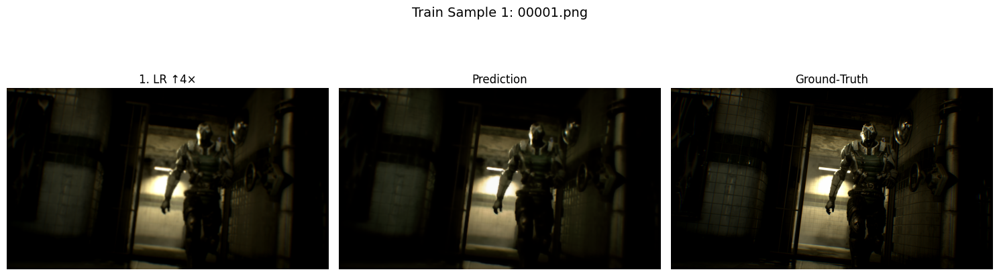

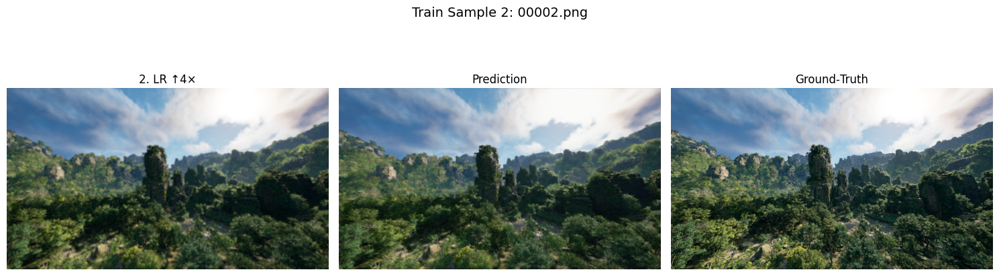

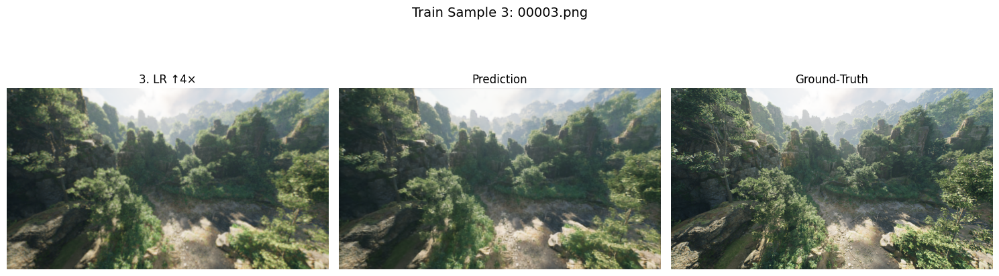

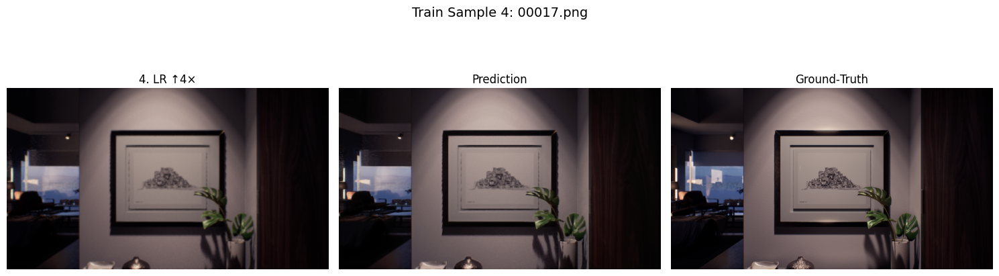

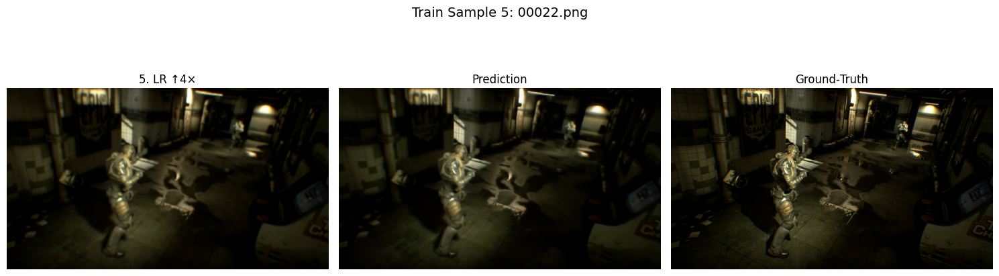

...

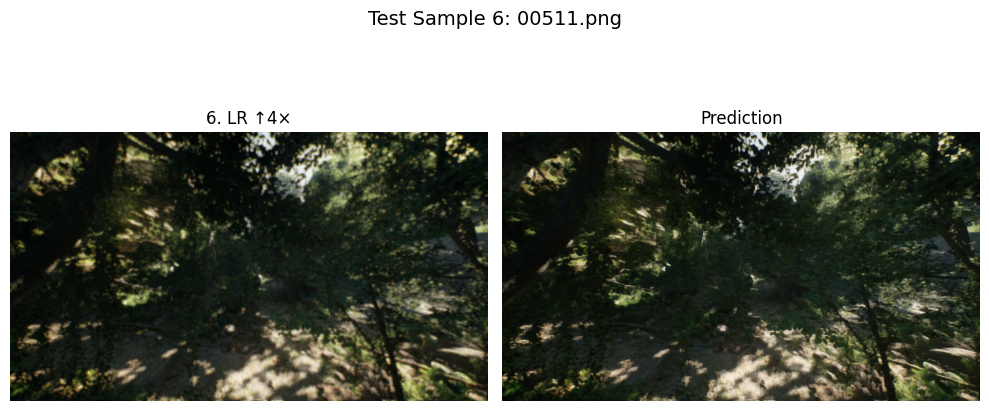

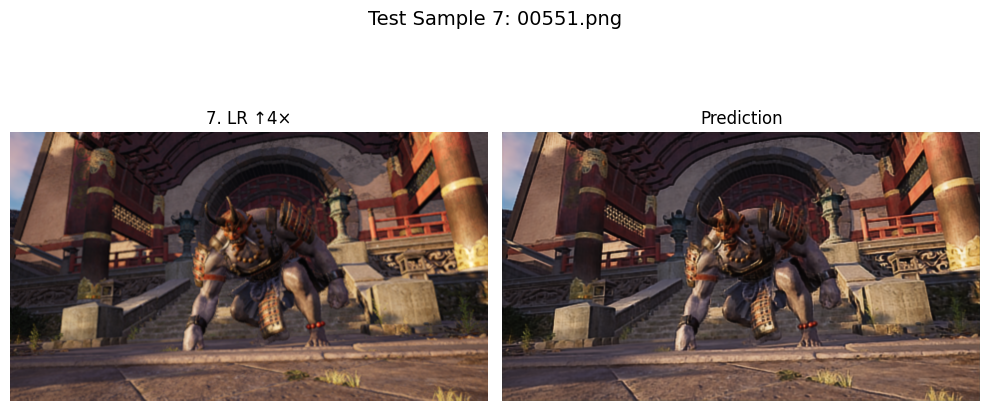

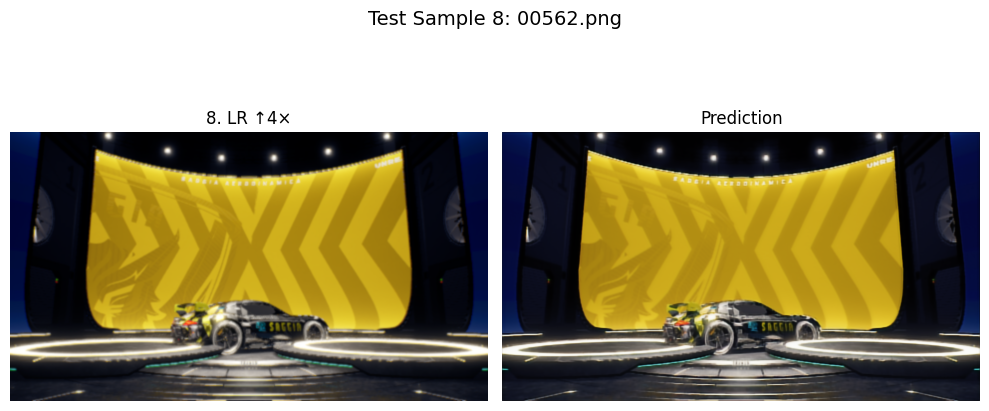

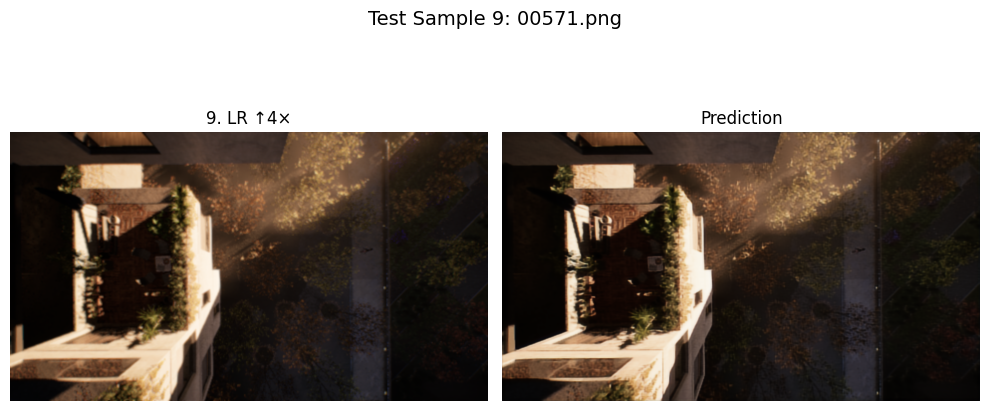

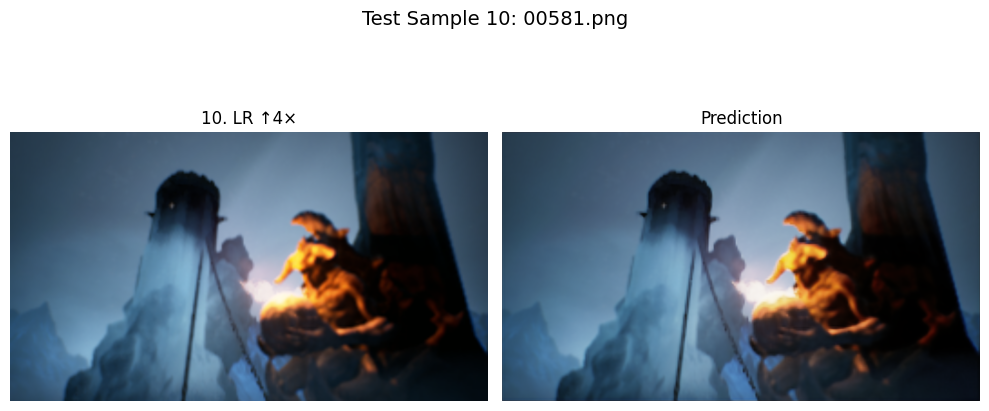

In [ ]:
import os
import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

##############################################
# 1. Setup Directories and Global Parameters
##############################################
TRAIN_LR_DIR = "/kaggle/input/gnr638/train-kaggle/train-kaggle/lr"
TRAIN_HR_DIR = "/kaggle/input/gnr638/train-kaggle/train-kaggle/hr"
TEST_LR_DIR  = "/kaggle/input/gnr638/lr/lr"
SUBMISSION_DIR = "/kaggle/working/submissions"
os.makedirs(SUBMISSION_DIR, exist_ok=True)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
BATCH_SIZE = 1     # Adjust according to your GPU memory
EPOCHS = 10        # Increase for better performance

NUM_WORKERS = 2    # Adjust if needed

##############################################
# 2. Define PyTorch Datasets
##############################################
class SRTrainDataset(Dataset):
    def __init__(self, lr_dir, hr_dir, filenames, transform=None):
        self.lr_dir = lr_dir
        self.hr_dir = hr_dir
        self.filenames = filenames
        self.transform = transform

    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        fname = self.filenames[idx]
        lr_path = os.path.join(self.lr_dir, fname)
        hr_path = os.path.join(self.hr_dir, fname)
        lr_img = cv2.imread(lr_path, cv2.IMREAD_COLOR)
        hr_img = cv2.imread(hr_path, cv2.IMREAD_COLOR)
        if lr_img is None or hr_img is None:
            raise ValueError(f"Failed to load images for {fname}")
        lr_img = cv2.cvtColor(lr_img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        hr_img = cv2.cvtColor(hr_img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        lr_img = torch.from_numpy(lr_img).permute(2, 0, 1)
        hr_img = torch.from_numpy(hr_img).permute(2, 0, 1)
        return lr_img, hr_img

class SRTestDataset(Dataset):
    def __init__(self, lr_dir, filenames, target_size=(480,270)):
        self.lr_dir = lr_dir
        self.filenames = filenames
        self.target_size = target_size

    def __len__(self):
        return len(self.filenames)
    
    def __getitem__(self, idx):
        fname = self.filenames[idx]
        path = os.path.join(self.lr_dir, fname)
        img = cv2.imread(path, cv2.IMREAD_COLOR)
        if img is None:
            raise ValueError(f"Failed to load test image: {fname}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
        img = cv2.resize(img, (self.target_size[0], self.target_size[1]))
        img = torch.from_numpy(img).permute(2, 0, 1)
        return img, fname

all_filenames = sorted(os.listdir(TRAIN_LR_DIR))
filenames = [f for f in all_filenames if os.path.exists(os.path.join(TRAIN_HR_DIR, f))]
dataset_size = len(filenames)
train_size = int(0.9 * dataset_size)
train_filenames = filenames[:train_size]
val_filenames = filenames[train_size:]

train_dataset = SRTrainDataset(TRAIN_LR_DIR, TRAIN_HR_DIR, train_filenames)
val_dataset = SRTrainDataset(TRAIN_LR_DIR, TRAIN_HR_DIR, val_filenames)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,
                          num_workers=NUM_WORKERS, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False,
                        num_workers=NUM_WORKERS, pin_memory=True)

test_filenames = sorted(os.listdir(TEST_LR_DIR))
test_dataset = SRTestDataset(TEST_LR_DIR, test_filenames)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False,
                         num_workers=NUM_WORKERS, pin_memory=True)

##############################################
# 3. Define an Insane Enhanced Super-Resolution Model
#    (Inspired by RRDB from ESRGAN)
##############################################

# Residual Dense Block (RDB)
class ResidualDenseBlock(nn.Module):
    def __init__(self, in_channels, growth_channels=32, num_layers=5):
        super(ResidualDenseBlock, self).__init__()
        self.layers = nn.ModuleList()
        for i in range(num_layers):
            self.layers.append(
                nn.Conv2d(in_channels + i * growth_channels, growth_channels, kernel_size=3, padding=1)
            )
        self.lrelu = nn.LeakyReLU(negative_slope=0.2, inplace=True)
        self.conv_1x1 = nn.Conv2d(in_channels + num_layers * growth_channels, in_channels, kernel_size=1)
        
    def forward(self, x):
        inputs = [x]
        for conv in self.layers:
            concat = torch.cat(inputs, 1)
            out = self.lrelu(conv(concat))
            inputs.append(out)
        out = torch.cat(inputs, 1)
        out = self.conv_1x1(out)
        return out * 0.2 + x  # residual scaling

# Residual-in-Residual Dense Block (RRDB)
class RRDB(nn.Module):
    def __init__(self, in_channels, growth_channels=32, num_layers=5):
        super(RRDB, self).__init__()
        self.rdb1 = ResidualDenseBlock(in_channels, growth_channels, num_layers)
        self.rdb2 = ResidualDenseBlock(in_channels, growth_channels, num_layers)
        self.rdb3 = ResidualDenseBlock(in_channels, growth_channels, num_layers)
        
    def forward(self, x):
        out = self.rdb1(x)
        out = self.rdb2(out)
        out = self.rdb3(out)
        return out * 0.2 + x  # residual scaling

# Upscale block using PixelShuffle remains similar
class UpscaleBlock(nn.Module):
    def __init__(self, in_channels, upscale_factor=2):
        super(UpscaleBlock, self).__init__()
        self.conv = nn.Conv2d(in_channels, in_channels * upscale_factor * upscale_factor, 3, padding=1)
        self.pixel_shuffle = nn.PixelShuffle(upscale_factor)
        self.lrelu = nn.LeakyReLU(negative_slope=0.2, inplace=True)
    def forward(self, x):
        x = self.conv(x)
        x = self.pixel_shuffle(x)
        return self.lrelu(x)

# InsaneSRNet: Our advanced model
class InsaneSRNet(nn.Module):
    def __init__(self, num_rrdb=5, in_channels=3, channels=64, upscale_factor=4):
        super(InsaneSRNet, self).__init__()
        self.head = nn.Conv2d(in_channels, channels, 3, padding=1)
        # RRDB trunk
        self.trunk = nn.Sequential(*[RRDB(channels) for _ in range(num_rrdb)])
        self.trunk_conv = nn.Conv2d(channels, channels, 3, padding=1)
        # Upscaling modules; for 4x upscale, we need two 2x stages.
        self.upscale1 = UpscaleBlock(channels, upscale_factor=2)
        self.upscale2 = UpscaleBlock(channels, upscale_factor=2)
        self.tail = nn.Conv2d(channels, in_channels, 3, padding=1)
        
    def forward(self, x):
        # Global skip connection: upscale the input by factor 4.
        skip = F.interpolate(x, scale_factor=4, mode='bilinear', align_corners=False)
        out = self.head(x)
        out = self.trunk(out)
        out = self.trunk_conv(out)
        out = self.upscale1(out)
        out = self.upscale2(out)
        out = self.tail(out)
        out += skip
        return torch.sigmoid(out)

# Instantiate the advanced model
model = InsaneSRNet(num_rrdb=5, in_channels=3, channels=64, upscale_factor=4).to(DEVICE)
optimizer = Adam(model.parameters(), lr=1e-4)
criterion = nn.MSELoss()

print("Advanced InsaneSRNet Model:")
print(model)

##############################################
# 4. Define Helper Metric Functions (PSNR & SSIM)
##############################################
def calculate_metrics(gt, pred):
    """
    gt, pred: numpy arrays of shape (H, W, C) in [0,1]
    Returns: joint metric, PSNR, SSIM.
    """
    h, w, _ = gt.shape
    win_size = 7 if min(h, w) >= 7 else (min(h, w) // 2 * 2 + 1)
    psnr_val = sk_psnr(gt, pred, data_range=1.0)
    ssim_val = sk_ssim(gt, pred, data_range=1.0, channel_axis=-1, win_size=win_size)
    joint_metric = 40 * ssim_val + psnr_val
    return joint_metric, psnr_val, ssim_val

##############################################
# 5. Helper Function for Image Encoding (Base64)
##############################################
def encode_image_to_base64(image_array):
    """
    image_array: numpy array of shape (H, W, C) in [0,1]
    Returns: Base64-encoded PNG string.
    """
    image_uint8 = np.clip(image_array * 255.0, 0, 255).astype(np.uint8)
    image_bgr = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2BGR)
    success, encoded_image = cv2.imencode('.png', image_bgr)
    if success:
        return base64.b64encode(encoded_image).decode('utf-8')
    else:
        raise ValueError("Image encoding failed.")

##############################################
# 6. Evaluation on the Validation Set
##############################################
def evaluate_model(model, dataloader):
    model.eval()
    joint_scores = []
    with torch.no_grad():
        for lr_imgs, hr_imgs in dataloader:
            lr_imgs = lr_imgs.to(DEVICE)
            outputs = model(lr_imgs)
            outputs_np = outputs.cpu().numpy()
            hr_imgs_np = hr_imgs.cpu().numpy()
            for pred, gt in zip(outputs_np, hr_imgs_np):
                pred = np.transpose(pred, (1, 2, 0))
                gt = np.transpose(gt, (1, 2, 0))
                joint, psnr_val, ssim_val = calculate_metrics(gt, pred)
                joint_scores.append(joint)
                print(f"PSNR: {psnr_val:.2f}, SSIM: {ssim_val:.4f}, Joint Metric: {joint:.2f}")
    avg_joint = np.mean(joint_scores)
    print(f"\nAverage Joint Metric on Validation Set: {avg_joint:.2f}")
    model.train()
    return avg_joint

##############################################
# 7. Generate Submission CSV after Each Epoch
##############################################
def generate_submission_csv(model, dataloader, test_filenames, epoch, submission_dir):
    model.eval()
    submission_records = []
    with torch.no_grad():
        for imgs, batch_fnames in tqdm(dataloader, desc="Generating submission"):
            imgs = imgs.to(DEVICE)
            preds = model(imgs)
            preds = preds.cpu().numpy()
            for pred, fname in zip(preds, batch_fnames):
                pred_img = np.transpose(pred, (1, 2, 0))
                encoded_str = encode_image_to_base64(pred_img)
                submission_records.append({'id': fname, 'Encoded_Image': encoded_str})
    df = pd.DataFrame(submission_records)
    csv_filename = os.path.join(submission_dir, f"submission_epoch{epoch+1}.csv")
    df.to_csv(csv_filename, index=False)
    print(f"Submission CSV saved for epoch {epoch+1} at: {csv_filename}")
    model.train()

##############################################
# 8. Training Loop with Mixed Precision, Weight Saving, and Submission CSV Generation
##############################################
scaler = GradScaler()
best_metric = -float('inf')

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{EPOCHS} - Training")
    for lr_imgs, hr_imgs in progress_bar:
        lr_imgs = lr_imgs.to(DEVICE)
        hr_imgs = hr_imgs.to(DEVICE)
        optimizer.zero_grad()
        with autocast(device_type='cuda'):
            outputs = model(lr_imgs)
            loss = criterion(outputs, hr_imgs)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        train_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())
    
    avg_train_loss = train_loss / len(train_loader)
    print(f"\nEpoch {epoch+1} Training Loss: {avg_train_loss:.6f}")
    
    # Generate submission CSV on test set after each epoch
    generate_submission_csv(model, test_loader, test_filenames, epoch, SUBMISSION_DIR)
    
    # Evaluate on validation set
    print("\nEvaluating on validation set:")
    avg_joint = evaluate_model(model, val_loader)
    
    # Save the latest weights
    latest_path = os.path.join(SUBMISSION_DIR, "latest.pth")
    torch.save(model.state_dict(), latest_path)
    print(f"Latest weights saved at: {latest_path}")
    
    # Save best weights if current performance improves
    if avg_joint > best_metric:
        best_metric = avg_joint
        best_path = os.path.join(SUBMISSION_DIR, "best.pth")
        torch.save(model.state_dict(), best_path)
        print(f"New best model saved at: {best_path}")
    
    torch.cuda.empty_cache()

print("Training completed.")

# —————————————————————————————
# 1) Model definition (matching your checkpoint keys)
# —————————————————————————————
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.conv1 = nn.Conv2d(channels, channels, 3, padding=1)
        self.conv2 = nn.Conv2d(channels, channels, 3, padding=1)
        self.relu  = nn.ReLU(inplace=True)
    def forward(self, x):
        out = self.relu(self.conv1(x))
        out = self.conv2(out) + x
        return self.relu(out)

class UpscaleBlock(nn.Module):
    def __init__(self, c, f=2):
        super().__init__()
        self.conv = nn.Conv2d(c, c*(f**2), 3, padding=1)
        self.ps   = nn.PixelShuffle(f)
        self.relu = nn.ReLU(inplace=True)
    def forward(self, x):
        return self.relu(self.ps(self.conv(x)))

class EnhancedSRNet(nn.Module):
    def __init__(self, num_rb=4):
        super().__init__()
        self.head      = nn.Conv2d(3, 64, 3, padding=1)
        self.residuals = nn.Sequential(*[ResidualBlock(64) for _ in range(num_rb)])
        self.upscale1  = UpscaleBlock(64, 2)
        self.upscale2  = UpscaleBlock(64, 2)
        self.tail      = nn.Conv2d(64, 3, 3, padding=1)

    def forward(self, x):
        inp = x
        out = torch.relu(self.head(x))
        out = self.residuals(out)
        out = self.upscale2(self.upscale1(out))
        out = self.tail(out)
        skip = F.interpolate(inp, scale_factor=4, mode='bilinear', align_corners=False)
        return torch.sigmoid(out + skip)

# —————————————————————————————
# 2) Paths & device
# —————————————————————————————
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIR   = "/kaggle/working/sr_outputs"
TRAIN_LR_DIR = "/kaggle/input/gnr638/train-kaggle/train-kaggle/lr"
TRAIN_HR_DIR = "/kaggle/input/gnr638/train-kaggle/train-kaggle/hr"
TEST_LR_DIR  = "/kaggle/input/gnr638/lr/lr"

# take first 10 of each
train_fns = sorted(os.listdir(TRAIN_LR_DIR))[:10]
test_fns  = sorted(os.listdir(TEST_LR_DIR))[:10]

# —————————————————————————————
# 3) Load model + remap checkpoint keys
# —————————————————————————————
model = EnhancedSRNet().to(DEVICE)
raw_ckpt = torch.load(os.path.join(OUTPUT_DIR, "best.pth"), map_location=DEVICE)
remapped = {}
for k, v in raw_ckpt.items():
    new_k = k.replace("res.",    "residuals.") \
             .replace("up1.",   "upscale1.")  \
             .replace("up2.",   "upscale2.")
    remapped[new_k] = v
model.load_state_dict(remapped)
model.eval()

# —————————————————————————————
# 4) Utility: upsample LR → match prediction size
# —————————————————————————————
def upsample_to(lr: np.ndarray, ref: np.ndarray) -> np.ndarray:
    h, w = ref.shape[:2]
    return cv2.resize(lr, (w, h), interpolation=cv2.INTER_LINEAR)

# —————————————————————————————
# 5) Display first 10 train samples
# —————————————————————————————
for i, fn in enumerate(train_fns, start=1):
    lr = cv2.cvtColor(cv2.imread(os.path.join(TRAIN_LR_DIR, fn)), cv2.COLOR_BGR2RGB).astype(np.float32)/255.0
    hr = cv2.cvtColor(cv2.imread(os.path.join(TRAIN_HR_DIR, fn)), cv2.COLOR_BGR2RGB).astype(np.float32)/255.0

    inp  = torch.from_numpy(lr).permute(2,0,1).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        pred = model(inp).cpu().squeeze().permute(1,2,0).numpy()

    lr_up = upsample_to(lr, pred)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(lr_up);    axes[0].set_title(f"{i}. LR ↑4×");    axes[0].axis("off")
    axes[1].imshow(pred);     axes[1].set_title("Prediction");      axes[1].axis("off")
    axes[2].imshow(hr);       axes[2].set_title("Ground‑Truth");     axes[2].axis("off")
    fig.suptitle(f"Train Sample {i}: {fn}", fontsize=14)
    plt.tight_layout()
    plt.show()

# —————————————————————————————
# 6) Display first 10 test samples
# —————————————————————————————
for i, fn in enumerate(test_fns, start=1):
    lr = cv2.cvtColor(cv2.imread(os.path.join(TEST_LR_DIR, fn)), cv2.COLOR_BGR2RGB).astype(np.float32)/255.0
    lr = cv2.resize(lr, (480, 270), interpolation=cv2.INTER_LINEAR)

    inp  = torch.from_numpy(lr).permute(2,0,1).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        pred = model(inp).cpu().squeeze().permute(1,2,0).numpy()

    lr_up = upsample_to(lr, pred)

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(lr_up);    axes[0].set_title(f"{i}. LR ↑4×");    axes[0].axis("off")
    axes[1].imshow(pred);     axes[1].set_title("Prediction");     axes[1].axis("off")
    fig.suptitle(f"Test Sample {i}: {fn}", fontsize=14)
    plt.tight_layout()
    plt.show()
